# Euler puede fracasar: sistemas con leyes de conservación

El método de Euler es sencillo y útil, pero tiene un defecto importante: ¡puede fracasar!, o sea, no integra correctamente las EDOs. De hecho, resulta que *casi siempre fracasa*, no sólo cuantitativamente, sino también cualitativamente.

Por ejemplo, consideremos la ecuación del péndulo para ángulos pequeños, o sea, un oscilador armónico simple, ahora *sin* amortiguamiento.

In [1]:
using Plots
gr(fmt=:png)

Plots.GRBackend()

#### Ejercicio 1

(i) Escribe la ecuación de movimiento del oscilador armónico simple, en términos del ángulo $\theta$ del péndulo desde el vertical, y la velocidad angular $\omega$.

$$\frac{d^2\theta}{dt^2}+\frac{g}{l}\theta=0 \cdots (1)$$ 
con $w^2=\frac{g}{l}$


(ii) Dibuja el campo vectorial.

In [2]:
ts = -10:10
xs = -10:10

tts = [t for t in ts for x in xs]
xxs = [x for t in ts for x in xs];

Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/4VL8h/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/4VL8h/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/4VL8h/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/4VL8h/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/4VL8h/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/4VL8h/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia/4VL8h/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/luismartinezrojas/.julia/packages/IJulia

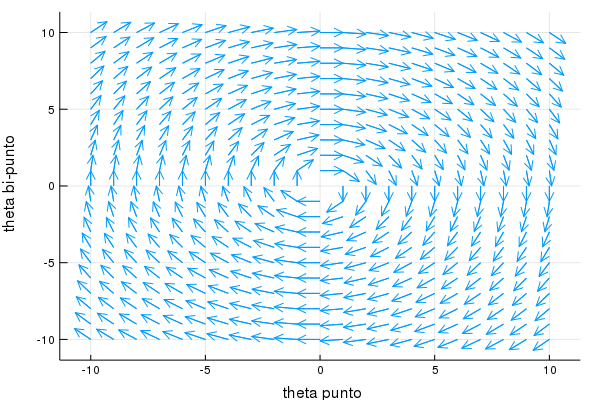

In [3]:
ω=1
f(x, z) = -x*ω^2
g(x,z)=z

df(x,z) = normalize([g(x,z),f(x,z)])

quiver(tts, xxs, quiver=df,ylabel=(" theta bi-punto"),xlabel=(" theta punto"))

(ii) Integra la ecuación utilizando el método de Euler dibuja bastantes trayectorias en el espacio fase  $(\theta, \omega)$, empezando desde distintas condiciones iniciales.
 ¿Tienen sentido físico? ¿Por qué?

In [4]:
include("herramientas.jl")

euler (generic function with 1 method)

In [5]:
u(x,t)=[x[2],-x[1]*ω^2]
p=plot(title=("Solucion para distintas condiciones iniciales"),ylabel=("omega"),xlabel=("theta"));

In [6]:
for i in 1:10
s=10-i/2
x0 = [s, 0]     
t0 = 0
h = 0.1
t, x = euler(u,x0,t0,100,h)
p=plot!(x[:,1],x[:,2],label=("angulo inicial $s"))
end

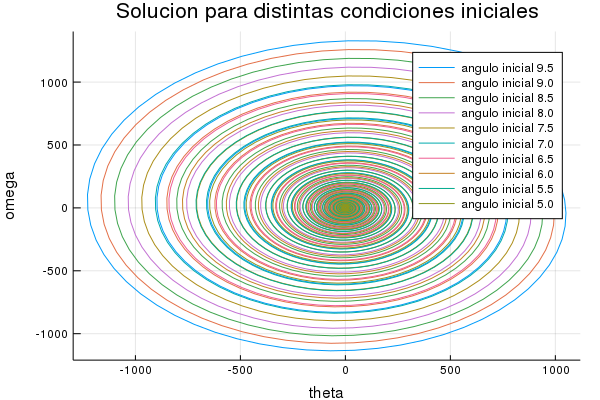

In [7]:
p

(iii) Recuerda que este sistema físico tiene una propiedad especial: existe una **ley de conservación**. ¿Cuál es la cantidad física que se conserva? Escríbela en términos de $\theta$ y $\omega$.

la cantidad que se conserva es la energía, y sabemos que si hay una simetria en el tiempo por el teorema de Noether que hay una simetria continua implica una conservacion de una cantidad física. veamos que si hay conservación en el tiempo y por ser en el tiempo la cantidad conservada es la energia.
De la ecuación (1) tenemos que.
$$\dot{\theta} \ddot{\theta}=-\omega^2 \dot{\theta}\theta$$
integrando por partes tenemos que
$$\frac{d}{dt}(\frac{1}{2}\dot{\theta}^2)=-\omega^2\frac{d}{dt}(\frac{1}{2}\theta^2)$$
lo que implica que:
$$\frac{d}{dt}(\dot{\theta}^2+\omega^2\theta^2)=0\Rightarrow \dot{\theta}^2+\omega^2\theta^2=cte$$

(iv) Dado que esta cantidad se conserva, ¿qué debe satisfacer una trayectoria que sale de una condición inicial dada? [Pista: piensa en **curvas de nivel**.] ¿Por qué? ¿Puedes escribir una ecuación que describe cómo evoluciona la cantidad conservada a lo largo del tiempo?

Utiliza `contour` para dibujar curvas de nivel, y compáralos gráficamente con las trayectorias que da Euler. ¿Qué observas?

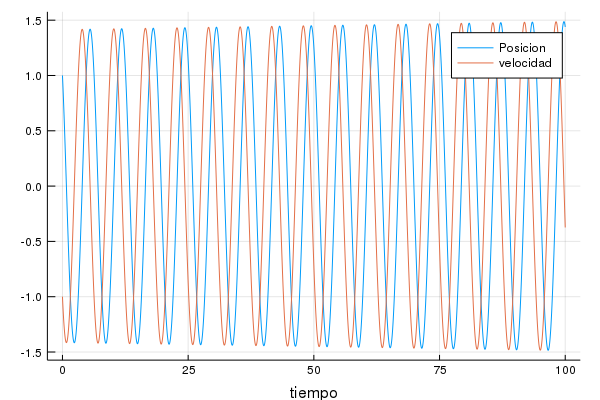

In [141]:
x0 = [1, -1]     
t0 = 0
h = 0.001
t, x = euler(u,x0,t0,100,h)
plot(t,x[:,1],label=("Posicion"),xlabel=("tiempo"))
plot!(t,x[:,2],label=("velocidad"))

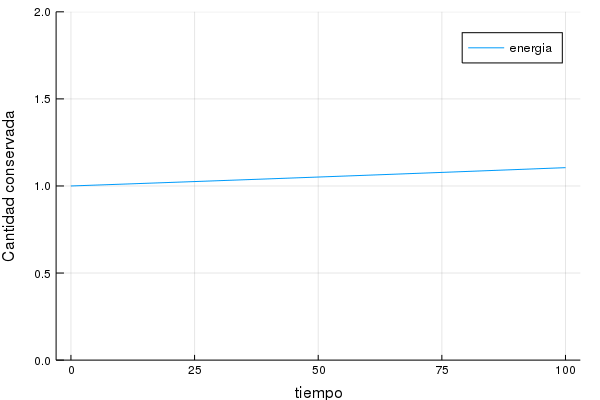

In [142]:
plot(t,0.5.*x[:,2].^2+(0.5*ω^2).*x[:,1].^2,ylabel=("Cantidad conservada"),
    xlabel=("tiempo"),ylim=(0,2),label=("energia"))

┌ Warning: `linspace(start, stop, length::Integer)` is deprecated, use `range(start, stop=stop, length=length)` instead.
│   caller = top-level scope at In[143]:1
└ @ Core In[143]:1
┌ Warning: `linspace(start, stop, length::Integer)` is deprecated, use `range(start, stop=stop, length=length)` instead.
│   caller = top-level scope at In[143]:3
└ @ Core In[143]:3


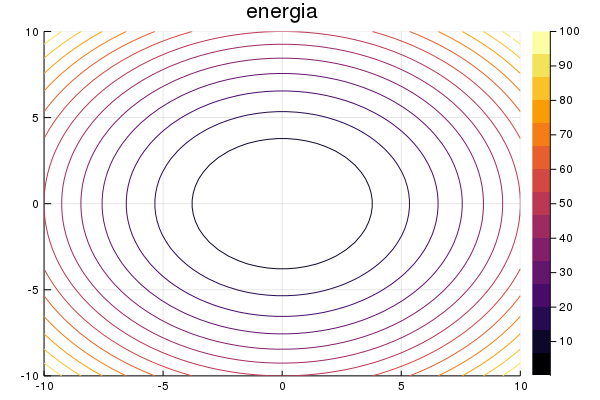

In [143]:
#ahora a hacerlo con countour
θp=linspace(-10,10,50)
θsp=linspace(-10,10,50)
ϵ=[0.5*tetap^2+0.5*ω^2*teta^2 for teta in θsp,tetap in θp]
contour(θsp,θp,ϵ,title=("energia"))

(v) Calcula numéricamente cómo varía la cantidad "conservada" a lo largo de una trayectoria calculada con Euler. ¿Qué ocurre?

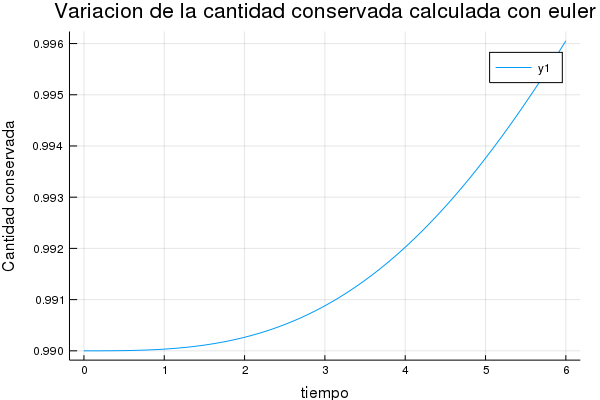

In [144]:
cte=1
v(x,t)=[x[2]^2,cte-x[1]*ω^2]
x0 = [0.99, 0]     
t0 = 0
h = 0.001
t1, x1 = euler(v,x0,t0,6,h)
plot(t1,x1[:,1],title=("Variacion de la cantidad conservada calculada con euler"),ylabel=("Cantidad conservada"),
xlabel=("tiempo"))

# El método de Euler-Cromer

Un cambio aparentemente insignificativo al método numérico puede dar resultados mucho mejores para ciertas clases de sistema.

En el llamado método de Euler-Cromer, actualizamos
*primero* la velocidad, y utilizamos esta *nueva* velocidad para actualizar la posición en las reglas usuales del método de Euler.

Ahora tenemos un sistema de segundo orden $\ddot{y}=f(x,t)$, para lo cual redefinimos $y=:x$ y por otro lado $\Rightarrow \dot{y}=:z$, lo cual nos dejaria elsiguiente sistema:
$$\dot{z}=f(x,t)$$
$$\dot{x}=z$$
Con lo que tenemos que 
$$\dot{y}(t+h)=\dot{y}(t)+hf(y,t)$$
$$y(t+h)=y(t)+h\dot{y}(t+h)$$
llamado euler-cromer

#### Ejercicio 2

(i) Aplica el método de Euler-Cromer al oscilador armónico. [Haz una versión nueva de tu código de Euler para 2 variables.] Dibuja trayectorias desde varios puntos iniciales en un solo plano fase, junto con las curvas de nivel y campo vectorial correspondientes.

In [131]:
function eulercro(f,g,x0,y0,t0,tf,h)
     #h=abs(tf-t0)/n
    
    ts = t0:h:tf
    x = zeros(length(ts))
    y = zeros(length(ts))
    x[1] = x0
    y[1] = y0
    for i in 1:length(ts)-1
        
        y[i+1] = h * g(x[i], y[i]) + y[i]
        x[i+1] = h * f(x[i], y[i+1]) + x[i]
    end
    return ts, x, y
end 


eulercro (generic function with 1 method)

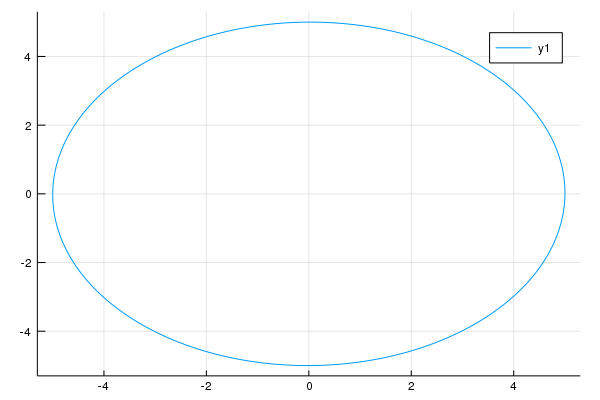

In [140]:
a=0.2
o=1
f1(x, y) = y
g1(x, y) =  - (o^2 * x)
x0=5
y0=0
h = 0.01
t0=0
t2, x2, y2 = eulercro(f1,g1, x0, y0, t0,t0+20,h)
plot(x2,y2)

(ii) Encuentra la tasa de convergencia de Euler_cromer a la solución exacta cuendo el tamaño $h$ de un paso converge a cero. ¿Cómo se compara con la tasa de convergencia del método de euler?

#### Ejercicio 3

(i) Escribe la EDO que describe un péndulo simple. ¿Cuál cantidad se conserva?

(ii) Aplica Euler-Cromer a este sistema y dibuja bastantes trayectorias en el espacio fase, junto con curvas de nivel y el campo vectorial correspondientes.

(iii) Dibuja el comportamiento de las dos componentes en función del tiempo. 

(iv) Resume el comportamiento físico del sistema.

(v) Hay regiones (puntos, curvas, etc.) especiales en el espacio fase? ¿Cuáles son, y a qué corresponden físicamente?


# El método de Euler para atrás

Tomemos otro punto de vista de los métodos numéricos para las EDOs.

Al integrar los dos lados de la EDO

$$\dot{x}(t) = f(x(t), t)$$

con respecto al tiempo para $t$ entre $t_0$ y $t_0+h$, obtenemos

$$x(t_0+h) - x(t_0) = \int_{t_0}^{t_0+h} f(x(t'), t') \, dt'.$$

Por lo tanto, podemos intentar aplicar los métodos numéricos que ya vimos para calcular integrales definidas a este problema.

#### Ejercicio 4

(i) ¿A cuál método de integración numérica corresponde el método de Euler? - es decir, ¿cómo se aproxima la función $f$ adentro de la integral?

(ii) Supón (para simplicidad) que $f$ no depende explícitamente de $t$ y escribe una fórmula analítica de cómo sería un paso del método del trapecio a la integral para encontrar una ecuación para $x(t_0 + h)$. ¿Qué *tipo de* ecuación resulta?

(iii) ¿Cuál método numérico podemos aplicar para resolver esta ecuación?

(iv) Implementa esto y pruébalo. Compara los resultados con los del método de Euler. ¿Converge más rápido?

(v) ¿Cómo se puede aplicar para sistemas con dos variables?